# Implementing a Variational AutoEncoder for clustering purposes

Goal : 

The goal of this file is to implement a Variational AutoEncoder (VAE) for projecting the variables used for this project into a latent space.

VAEs are a new concept that allows us to do non linear dimension reduction, in a coherent way. The model of the variational autoencoder consists in two parts :
- An encoder, that takes our data and encode it in a distribution in lower dimension, predicting two vectors, one for the mean and another for the variance of the distribution
- A decoder, that will try to decode samples of the generated distributions into the original data

The distributions predicted by the encoder are choosen to be normal. We want their mean to be close to zero, and their variance close to 1. This idea makes it hard for the model to distinguish samples of the distributions. For example, lets assume a model whose distributions picked by the encoder are all gaussians with $\mu=0$ and $\sigma=0$. Then, it is impossible for the model to recover the original data : there is a tradeoff between the reconstruction and the divergence of the distributions from a standard normal law. This tradeoff is handled through the weights of the reconstrcuction loss and the divergence loss : the model will minimize the weighted sum of the two losses. We choose the reconstruction loss to be the L2 distance from the decoded data and the original data, and the divergence loss to be the kullback leibler divergence between the distributions and a standard normal distribution. In practice, we found the weights by trial and error, as there are no real formula for this (or at least we did not find one).


References : 

- Auto-Encoding Variational Bayes, the original paper : https://arxiv.org/abs/1312.6114
- A video explaining the fundamentals of a VAE : https://www.youtube.com/watch?v=lTy_AAjSTD8
- An article from TowardsDataScience explaining how variatonal autoencoders works at a higher level https://towardsdatascience.com/understanding-variational-autoencoders-vaes-f70510919f73

# Part 1 - Imports / Parameters / Data loading

In [133]:
# Import the modules
import torch
import torch.optim as optim

# Start tensorboard
import subprocess
cmd = ["tensorboard", "--logdir=runs"]
tensorboard_process = subprocess.Popen(cmd)
print("TensorBoard is running. You can access it at http://localhost:6006")

import sklearn
from sklearn.datasets import load_digits

import numpy as np

from collections import OrderedDict
import matplotlib.pyplot as plt

import netCDF4 as nc

import math
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go

from scipy.optimize import linear_sum_assignment

from sklearn.cluster import KMeans

import cv2
import netCDF4 as nc

TensorBoard is running. You can access it at http://localhost:6006


In [138]:
# Parameters used in this notebook

# Clustering parameters
DHR_variables = ['DHR1020', 'DHR443', 'DHR490', 'DHR565', 'DHR670', 'DHR865']

clustering_variables = DHR_variables + ['NDVI', 'Ross_Li_BRDF_670_geometric_parameter', 'Ross_Li_BRDF_670_volumetric_parameter'] # Define the variables used for clustering
# clustering_variables = ['Ross_Li_BRDF_670_geometric_parameter', 'DHR670', 'SSA670', 'AAOD670', 'AODF1020', 'AExp', 'NDVI']
# clustering_variables = ['Water_Fraction_C', 'BrC_Fraction_C', 'Insoluble_Fraction_C', 'Iron_Fraction_C', 'NDVI']

num_clusters = 10   # Define the number of clusters

# Data parameters
selection = 'land' # Define the selection of the data (land, sea, both)

# Autoencoder parameters

input_dim = len(clustering_variables) # Define the input dimension of the autoencoder
n_latent = 2
n_hidden = input_dim

LR = 1e-3
EPOCHS = 30
BATCH_SIZE = 256

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using {device} device")
print(f"Number of latent variables: {n_latent}")
print(f"Number of hidden neurons: {n_hidden}")
print(f"Variables used for clustering: {clustering_variables}")


Using cuda device
Number of latent variables: 2
Number of hidden neurons: 9
Variables used for clustering: ['DHR1020', 'DHR443', 'DHR490', 'DHR565', 'DHR670', 'DHR865', 'NDVI', 'Ross_Li_BRDF_670_geometric_parameter', 'Ross_Li_BRDF_670_volumetric_parameter']


In [139]:
# Load the data
from load_data import *
file_path = 'data/GRASP_POLDER_L3_climatological_S1.1degree.nc'
data, df = get_data('land', clustering_variables, file_path, fill_value=-1000)
dataset = torch.utils.data.DataLoader(data, batch_size = BATCH_SIZE, shuffle=True)

In [140]:
first_col = (df['DHR565'] - df['DHR490']) / (df['DHR490'] + df['DHR565'])
second_col = (df['DHR670'] - df['DHR565']) / (df['DHR565'] + df['DHR670'])
third_col = (df['DHR865'] - df['DHR670']) / (df['DHR865'] + df['DHR670'])
fourth_col = df['DHR670']
fifth_col = df['Ross_Li_BRDF_670_geometric_parameter']
sixth_col = df['Ross_Li_BRDF_670_volumetric_parameter']


data = np.array([first_col, second_col, third_col, fourth_col, fifth_col, sixth_col]).T

from load_data import normalize
data = normalize(data)
input_dim = data.shape[1]

dataset = torch.utils.data.DataLoader(data, batch_size = BATCH_SIZE, shuffle=True)

# Part 2 - Variational AutoEncoder for dimensionality reduction, with a 2D latent space

One of the main advantages of using a VAE is that we can visualize what happens in the latent space, as it is, in this case, 2-dimensional. It is especially useful for visualizing the distributions of the variables

In [213]:
from variational_autoencoder import *

model = VariatonalAutoEncoder(input_dim, hidden_dim=20, latent_dim=n_latent)
optimizer = optim.Adam(model.parameters(), LR)

model

VariatonalAutoEncoder(
  (encoder): Sequential(
    (0): Linear(in_features=6, out_features=20, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=20, out_features=20, bias=True)
    (3): ReLU()
    (4): Linear(in_features=20, out_features=20, bias=True)
    (5): ReLU()
    (6): Linear(in_features=20, out_features=20, bias=True)
  )
  (mean_layer): Linear(in_features=20, out_features=2, bias=True)
  (logvar_layer): Linear(in_features=20, out_features=2, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=2, out_features=20, bias=True)
    (1): ReLU()
    (2): Linear(in_features=20, out_features=20, bias=True)
    (3): ReLU()
    (4): Linear(in_features=20, out_features=20, bias=True)
    (5): ReLU()
    (6): Linear(in_features=20, out_features=6, bias=True)
  )
)

In [214]:
fit_model(model,
          optimizer,
          dataset,
          device,
          EPOCHS,
          alpha=1e-4, # loss = reconstruction_loss + alpha * KL_divergence
          verbose=True)

Epoch N°0/30 ; MSE : 0.9205 ; Rsquared : 0.0589; Average loss : 0.9248; Ressemblance : 0.9205; Divergence : 0.0043
Epoch N°1/30 ; MSE : 0.4240 ; Rsquared : 0.5601; Average loss : 0.4813; Ressemblance : 0.4240; Divergence : 0.0573
Epoch N°2/30 ; MSE : 0.2549 ; Rsquared : 0.7501; Average loss : 0.3130; Ressemblance : 0.2549; Divergence : 0.0581
Epoch N°3/30 ; MSE : 0.2137 ; Rsquared : 0.7807; Average loss : 0.2672; Ressemblance : 0.2137; Divergence : 0.0535
Epoch N°4/30 ; MSE : 0.1989 ; Rsquared : 0.7995; Average loss : 0.2497; Ressemblance : 0.1989; Divergence : 0.0508
Epoch N°5/30 ; MSE : 0.1853 ; Rsquared : 0.8245; Average loss : 0.2330; Ressemblance : 0.1853; Divergence : 0.0477
Epoch N°6/30 ; MSE : 0.1734 ; Rsquared : 0.8425; Average loss : 0.2199; Ressemblance : 0.1734; Divergence : 0.0465
Epoch N°7/30 ; MSE : 0.1651 ; Rsquared : 0.8297; Average loss : 0.2117; Ressemblance : 0.1651; Divergence : 0.0465
Epoch N°8/30 ; MSE : 0.1589 ; Rsquared : 0.8372; Average loss : 0.2056; Ressembl

In [215]:
# make the predictions over the dataset to get the latent variables
model.eval()
with torch.no_grad():
    _, mean, logvar = model.forward(torch.Tensor(data).to(device))

C:\Users\Mathis\AppData\Local\Temp\ipykernel_7380\1108607971.py:12: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



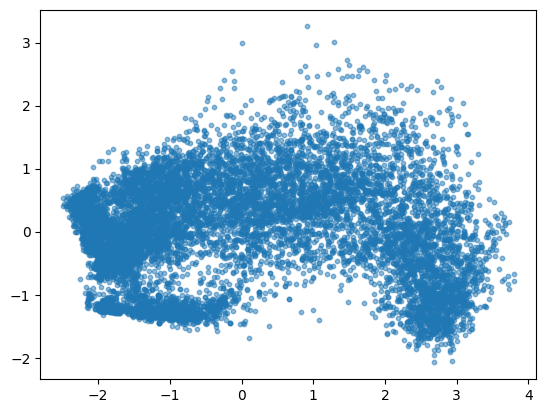

C:\Users\Mathis\AppData\Local\Temp\ipykernel_7380\1108607971.py:15: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



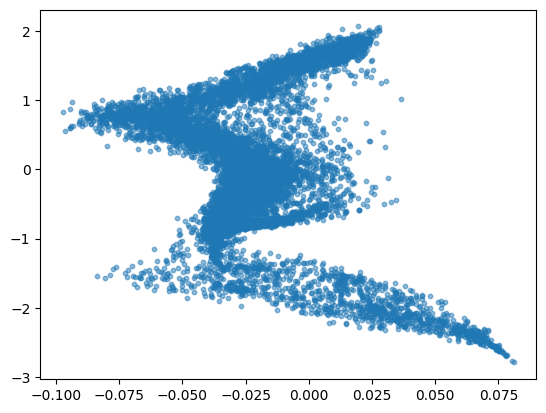

MSE : 0.0645 ; R2 : 0.9355


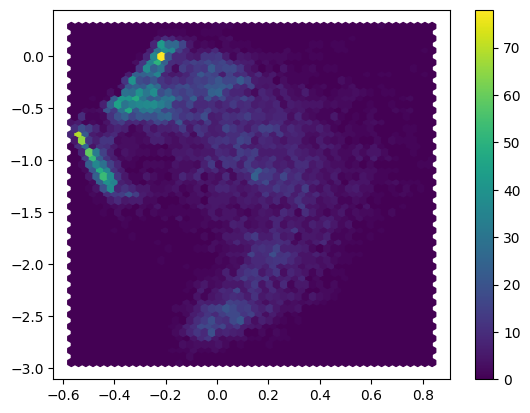

In [216]:
import torch.nn.functional as F

# we compare to a PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

# Create a color map for the different numbers
cmap = plt.get_cmap('tab10')

# use the same data as before
pca_data = pca.fit_transform(data)
plt.scatter(pca_data[:, 0], pca_data[:, 1], cmap=cmap, s=10, alpha=0.5)
plt.show()

plt.scatter(mean[:, 0].detach().cpu(), mean[:, 1].detach().cpu(), cmap=cmap, s=10, alpha=0.5)
plt.show()

# Inverse transform
pca_data = pca.inverse_transform(pca_data)

MSE = F.mse_loss(torch.Tensor(pca_data), torch.Tensor(data))
R2 = 1 - MSE/data.var()
print(f'MSE : {MSE.mean():.4f} ; R2 : {R2.mean():.4f}')

# make an hexbin plot
plt.hexbin(pca_data[:, 0], pca_data[:, 1], cmap='viridis', gridsize=50)
plt.colorbar()
plt.show()

In [217]:
# import kmeans 
from utils import plot_variable, show_results, plot_clusters

kmeans = KMeans(n_clusters=20)
kmeans.fit(mean.cpu().detach().numpy())
labels = kmeans.labels_
t = df.copy()[clustering_variables]
t.dropna(inplace=True)

t['clusters'] = labels
t['Latitude'] = df['Latitude']
t['Longitude'] = df['Longitude']

plot_clusters(t, 'clusters', kmeans.cluster_centers_)

c:\Users\Mathis\.conda\envs\ProjetTunnel\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [233]:
# import dbscan
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.005, min_samples=10)

dbscan.fit(mean.cpu().detach().numpy())
labels = dbscan.labels_
t = df.copy()[clustering_variables]
t.dropna(inplace=True)

t['clusters'] = labels
t['Latitude'] = df['Latitude']
t['Longitude'] = df['Longitude']

plot_clusters(t, 'clusters', dbscan.components_)

In [178]:
thetas = np.linspace(xy.min(), xy.max(), 10)[None, :]

t['c'] = (xy[:, None] < thetas).argmax(axis=1)
plot_variable(t, 'c')

In [152]:
import numpy as np
import plotly.graph_objs as go

def make_density_plot(x, y, x_center, y_center, filename=None, nbins=20):
    # Calculate 2D density
    density, xedges, yedges = np.histogram2d(x, y, bins=nbins, density=True)
    xcenters = (xedges[:-1] + xedges[1:]) / 2
    ycenters = (yedges[:-1] + yedges[1:]) / 2

    # Create a 3D surface plot
    surface = go.Surface(x=xcenters, y=ycenters, z=density.T)

    # Create spikes for x_center and y_center
    spikes_x = []
    spikes_y = []
    spikes_z = []
    for xc, yc in zip(x_center, y_center):
        spikes_x.extend([xc, xc, None])
        spikes_y.extend([yc, yc, None])
        spikes_z.extend([0, density.max(), None])

    spikes = go.Scatter3d(
        x=spikes_x,
        y=spikes_y,
        z=spikes_z,
        mode='lines',
        line=dict(color='red', width=2),
        name='Dirac Deltas'
    )

    # Create layout
    layout = go.Layout(
        title='3D Density Surface Plot with Dirac Deltas',
        scene=dict(
            xaxis=dict(title='X'),
            yaxis=dict(title='Y'),
            zaxis=dict(title='Density')
        )
    )

    # Create figure and plot
    fig = go.Figure(data=[surface, spikes], layout=layout)
    fig.show()
    if filename:
        fig.write_html(filename)
        import webbrowser
        webbrowser.open_new_tab(filename)

xy = mean.cpu().detach().numpy()

make_density_plot(xy[:, 0], xy[:, 1], kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 'density_plot_with_centers.html', nbins=100)

In [153]:
decoded_clusters = model.decoder(torch.Tensor(kmeans.cluster_centers_).to(device))
decoded_clusters = decoded_clusters.cpu().detach().numpy()

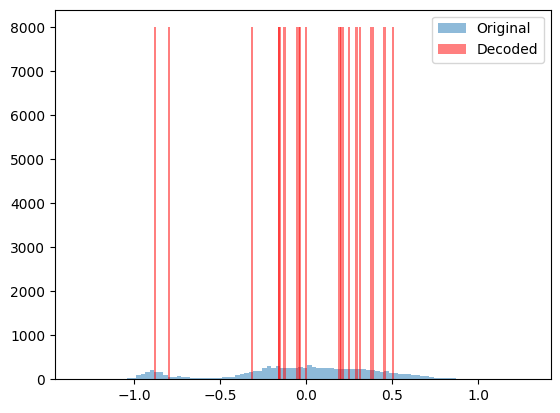

In [154]:
k = 0
x_decoded = decoded_clusters[:, k]
x = data[:, k]
# show an histogram of the original data and plot the decoded data on top
plt.hist(x, bins=100, alpha=0.5, label='Original')
plt.bar(x_decoded, 8000*np.ones_like(x_decoded), width=(x.max()-x.min())/200, alpha=0.5, label='Decoded', color='red')
plt.legend()

In [155]:
with open('clusters.html', 'r') as f:
    html_content = f.read()
writer.add_text("Plotly Graph", html_content, global_step=0)

NameError: name 'writer' is not defined

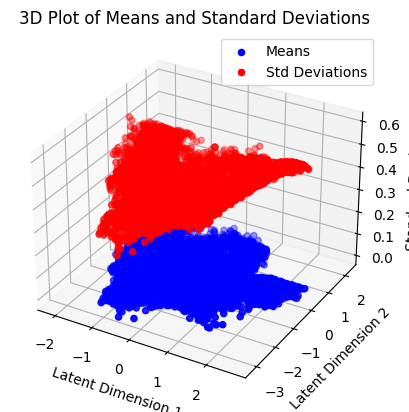

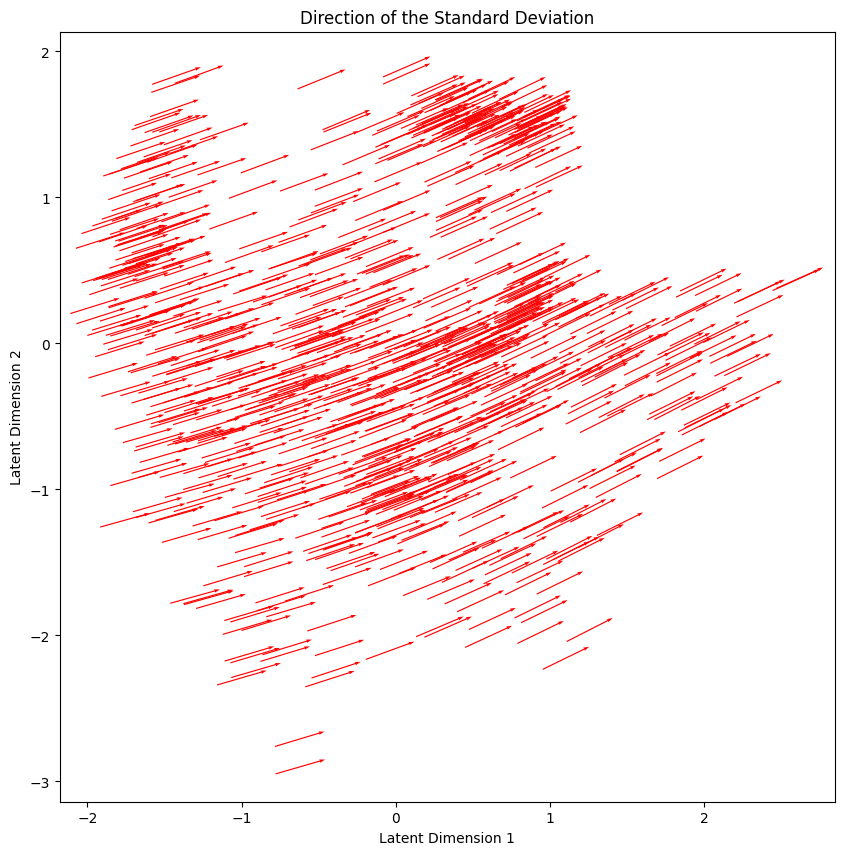

In [156]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Get the standard deviations for each dimension
std_y = torch.exp(0.5 * logvar[:, 0]).cpu().detach().numpy()
std_x = torch.exp(0.5 * logvar[:, 1]).cpu().detach().numpy()

# Plot the means and standard deviations
ax.scatter(mean[:, 0].cpu().detach().numpy(), mean[:, 1].cpu().detach().numpy(), zs=0, c='b', label='Means')
ax.scatter(mean[:, 0].cpu().detach().numpy(), mean[:, 1].cpu().detach().numpy(), zs=std_x, c='r', label='Std Deviations')

# Add labels and title to the plot
ax.set_xlabel('Latent Dimension 1')
ax.set_ylabel('Latent Dimension 2')
ax.set_zlabel('Standard Deviation')
ax.set_title('3D Plot of Means and Standard Deviations')

# Add a legend
ax.legend()

# Show the plot
plt.show()

# # Now using plotly
# fig = go.Figure(data=[go.Scatter3d(
#     x=mean[:, 0].cpu().detach().numpy(),
#     y=mean[:, 1].cpu().detach().numpy(),
#     z=np.zeros_like(mean[:, 0].cpu().detach().numpy()),
#     mode='markers',
#     marker=dict(
#         size=12,
#         color='blue',                # set color to an array/list of desired values
#         colorscale='Viridis',   # choose a colorscale
#         opacity=0.8
#     )
# )])

# fig.add_trace(go.Scatter3d(
#     x=mean[:, 0].cpu().detach().numpy(),
#     y=mean[:, 1].cpu().detach().numpy(),
#     z=torch.exp(0.5 * logvar[:, 0]).cpu().detach().numpy(),
#     mode='markers',
#     marker=dict(
#         size=12,
#         color='red',                # set color to an array/list of desired values
#         colorscale='Viridis',   # choose a colorscale
#         opacity=0.8
#     )
# ))

# fig.show()

# now we dot a plot of the direction of the standard deviation

# select the first 1000 points
mask = np.random.choice(len(mean), 1000, replace=False)

direction = np.stack([std_x, std_y], axis=-1)[mask]
direction /= np.linalg.norm(direction, axis=-1)[:, np.newaxis]
# Plot the direction of the standard deviation
plt.figure(figsize=(10, 10))
plt.quiver(mean[:, 0].cpu().detach().numpy()[mask], mean[:, 1].cpu().detach().numpy()[mask], direction[:, 0], direction[:, 1], scale=15, pivot='mid', color='r', width=0.0015)
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.title('Direction of the Standard Deviation')
plt.show()


# 1-D VAE

In [161]:
model = VariatonalAutoEncoder(input_dim, hidden_dim=28, latent_dim=1)
optimizer = optim.Adam(model.parameters(), LR)

fit_model(model,
          optimizer,
          dataset,
          device,
          60,
          alpha=1e-4, # loss = reconstruction_loss + alpha * KL_divergence
          verbose=True)

Epoch N°0/60 ; MSE : 0.8517 ; Rsquared : 0.1271; Average loss : 0.8526; Ressemblance : 0.8517; Divergence : 0.0009
Epoch N°1/60 ; MSE : 0.5535 ; Rsquared : 0.4868; Average loss : 0.5815; Ressemblance : 0.5535; Divergence : 0.0280
Epoch N°2/60 ; MSE : 0.4678 ; Rsquared : 0.5943; Average loss : 0.4990; Ressemblance : 0.4678; Divergence : 0.0312
Epoch N°3/60 ; MSE : 0.4286 ; Rsquared : 0.5215; Average loss : 0.4609; Ressemblance : 0.4286; Divergence : 0.0324
Epoch N°4/60 ; MSE : 0.3875 ; Rsquared : 0.5921; Average loss : 0.4230; Ressemblance : 0.3875; Divergence : 0.0354
Epoch N°5/60 ; MSE : 0.3391 ; Rsquared : 0.5848; Average loss : 0.3839; Ressemblance : 0.3391; Divergence : 0.0448
Epoch N°6/60 ; MSE : 0.3036 ; Rsquared : 0.7306; Average loss : 0.3545; Ressemblance : 0.3036; Divergence : 0.0509
Epoch N°7/60 ; MSE : 0.2918 ; Rsquared : 0.7086; Average loss : 0.3442; Ressemblance : 0.2918; Divergence : 0.0524
Epoch N°8/60 ; MSE : 0.2793 ; Rsquared : 0.7049; Average loss : 0.3326; Ressembl

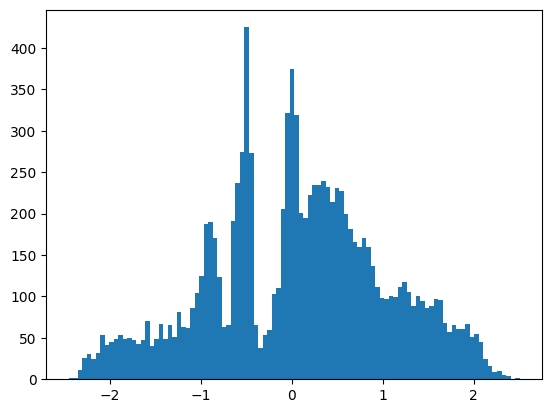

In [162]:
_, mean, logvar = model.forward(torch.Tensor(data).to(device))

xy = mean.cpu().detach().numpy()[:, 0]

plt.hist(xy, bins=100)
pass

In [163]:
xy.shape

(10870,)

In [166]:
t['clusters'] = xy
plot_variable(t, 'clusters', colormap=cm.plasma)

# Using the old variables :

In [54]:
t['clusters'] = xy
plot_variable(t, 'clusters')